# Spatial Outlier Detection

In [196]:
# !pip install pdfkit
# !sudo apt-get install wkhtmltopdf
# !pip install PyMuPDF
# ! pip install imgkit
! pip install html2image

   ---------------------------------------- 0.0/58.8 kB ? eta -:--:--
   ---------------------------------------- 58.8/58.8 kB 1.0 MB/s eta 0:00:00


In [1]:
import imgkit
import pandas as pd
import geopandas as gpd
import os
import folium
from folium.plugins import MarkerCluster, FloatImage
import numpy as np
import branca.colormap as cm
import matplotlib.pyplot as plt
import fiona
import sklearn
import h5py
import seaborn as sns
import pickle
import imageio
import pdfkit
import fitz 
from sklearn.neighbors import LocalOutlierFactor, NearestNeighbors, RadiusNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import jaccard_score
from sklearn.metrics.pairwise import haversine_distances
from scipy.stats import spearmanr
from datetime import datetime
from pyproj import Proj, transform
from html2image import Html2Image

os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis")

### Load Data

In [15]:
df_ghana = gpd.read_file('GEDI_Ghana.geojson'
                         , driver = 'GeoJSON'
                         )

# categorise columns
cat_cols = ["pft_class", "region_cla", "leaf_off_f", "beam", "selected_a"]
num_cols = ["urban_prop","agbd","agbd_se", "elev_lowes", "lat_lowest", "lon_lowest"
            , "sensitivit", "solar_elev", "rh98", "doy_sin", "doy_cos"]

In [2]:
df_ghana_subsample = gpd.read_file('df_ghana_subsample.geojson'
                         , driver = 'GeoJSON')
                         # , engine='pyogrio')

# categorise columns
cat_cols = ["pft_class", "region_cla", "leaf_off_f", "beam", "selected_a"]
num_cols = ["urban_prop","agbd","agbd_se", "elev_lowes", "lat_lowest", "lon_lowest"
            , "sensitivit", "solar_elev", "rh98", "doy_sin", "doy_cos"]

### Trying Spatial Methods

We formulate the problem like (Lu, Chen and Kou, 2003): 

* $ X = \{x_1, \ldots, x_n\}$ are spatial points in a space of dimension $p=2$
* $f: X \to \mathbb{R}$ is an attribute function, with $f(x_i)$ the non-spatial attribute: `agbd`
* $NN_k(x_i)$ denotes the $k$ nearest neighbours to $x_i$, where $k = k(x_i)$ depends on $x_i$ (though for simplicity, I think we should at least _begin_ with fixed $k$)
* $g(x_i): X \to \mathbb{R}$ is the neighbourhood function, returning a summary statistic of `agbd` values of the $x_j \in NN_k(x_i)$
* $h$ is a comparison function to compare the attributes of a point $x_i$ with the attributes of its neighbours. $h$ is a function of $f$ and $g$, e.g. $h = f / g$ or $h = f - g$
* $y_i = h(x_i)$ are the values of $h$ evaluated at the datapoints in $X$
* We define $x_i$ as an outlier if $y_i$ is an extreme value of the set $Y = \{y_1, \ldots, y_n\}$

The authors propose three algorithms, differentiated by choices of the neighbourhood function $g$ and comparison function $h$:

* Algorithm 1: $g(x_i) = \frac{1}{k} \sum_{x \in NN_k(x_i)} f(x)$ and $y_i = h(x_i) = \frac{f(x_i)}{g(x_i)}$
* Algorithm 2: $g(x_i) = \frac{1}{k} \sum_{x \in NN_k(x_i)} f(x)$, $h(x_i) = f(x_i) - g(x_i)$ and $y_i = |\frac{h_i - \mu}{\sigma}|$
* Algorithm 3: $g(x_i) = $ median of the set $\{ f(x) : x \in NN_k(x_i) \}$, $h(x_i) = f(x_i) - g(x_i)$ and $y_i = |\frac{h_i - \mu}{\sigma}|$  

#### Helper functions for the algorithms

In [3]:
def preprocess(gdf: gpd.GeoDataFrame):
    """
    Preprocess the data for the spatial outlier detection algorithms. Tailored for Ghana.

    INPUTS:
    gdf: GeoDataFrame with 'agbd' and 'geometry' at a minimum (gpd.GeoDataFrame)

    OUTPUTS:
    gdf: GeoDataFrame with 'lat' and 'lon'
    """
    # silence warnings about assigning to a copy
    pd.options.mode.chained_assignment = None

    # reset index
    gdf = gdf.reset_index(drop=True)

    # filter dataframe and define lat, lon columns
    geo_cols = ['lat', 'lon', 'x', 'y']

    if any([geo_col not in gdf.columns for geo_col in geo_cols]):
        gdf = gdf[['agbd', 'geometry']]
        gdf['lon'] = gdf['geometry'].x
        gdf['lat'] = gdf['geometry'].y
        gdf = gdf.drop('geometry', axis=1)

        # set new geometry
        original_epsg, target_epsg = 'EPSG:4326', 'EPSG:25000' 
        original_proj, target_proj = Proj(init=original_epsg), Proj(init=target_epsg)
        gdf['x'], gdf['y'] = transform(original_proj, target_proj, gdf['lon'].values, gdf['lat'].values)
        

    else: 
        print("No preprocessing applied. Perhaps the data is already processed.")
 
    return gdf

In [4]:
def get_neighbours(gdf: gpd.GeoDataFrame, r: float=1.0):
    """
    Compute neigbours within circle of radius r around each point.

    INPUTS:
    gdf: GeoDataFrame with columns 'x' and 'y' (gpd.GeoDataFrame)
    r: radius of circle around point in km (float)

    OUTPUTS:
    distances: kilometer distances between points (np.ndarray)
    indices: indices of nearest neighbours (np.ndarray)
    """
    r *= 1000 # km -> m

    coordinates = gdf[['y', 'x']].values
    nbrs = NearestNeighbors(radius=r, algorithm='ball_tree', metric='euclidean').fit(coordinates)
    rng = nbrs.radius_neighbors(coordinates, sort_results=True)

    # distances, indices
    return rng[0], rng[1]

In [5]:
def get_knn(gdf: gpd.GeoDataFrame, k: int=20):
    """
    Compute k nearest neighbours to each point in gdf. A point is its own closest neighbour.

    INPUTS:
    gdf: GeoDataFrame with columns 'lat' and 'lon' (gpd.GeoDataFrame)
    k: number of neighbours to compute (int)

    OUTPUTS:
    distances: kilometer distances between points (np.ndarray)
    indices: indices of nearest neighbours (np.ndarray)
    """
    coordinates = gdf[['y', 'x']].values
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree', metric='euclidean').fit(coordinates)
    distances, indices = nbrs.kneighbors(coordinates)

    # reshape for downstream consistency
    d, i = np.empty(shape=(len(gdf),), dtype=np.ndarray), np.empty(shape=(len(gdf),), dtype=np.ndarray)

    for j in range(len(gdf)):
        d[j] = distances[j]
        i[j] = indices[j]

    return d, i

In [6]:
def compute_g(gdf:gpd.GeoDataFrame, f_x: pd.Series, indices: np.ndarray, g: str="mean"
              , g_x: np.ndarray=None, y_q: np.ndarray=None):
    """
    Compute neighbourhood function g at every observation

    INPUTS:
    gdf:  GeoDataFrame with column 'agbd' (gpd.GeoDataFrame)
    f_x: attribute function at neighbours of x (pd.Series)
    indices: indices of nearest neighbours (np.ndarray)
    g: neighbourhood function, "mean" or "median" (string)
    g_x: computed g values (np.ndarray) or None if no g values have yet been computed
    y_q: index of latest outlier (np.ndarray) or None if no outliers have yet been computed

    OUTPUTS: 
    g_x: result of applying g to each point's neighbours (np.ndarray)
    """

    if g_x is None:
        g_x = np.zeros(shape=(len(gdf),))

    if y_q is not None:
        # block only runs when we compute outliers one by one 
        try: g_to_update = indices[y_q == 1][0]
        except IndexError: g_to_update = np.empty(0, dtype=int)
        indices = indices[g_to_update]

    # apply g to the KNNs
    for row in indices: 

        # since a point is its own nearest neighbour (when rows unique)
        # and we reset indices
        i = row[0]

        # filter gdf to neighbours
        neighbours = row[1:]
        gdf_neighbours = gdf[gdf.index.isin(neighbours)]

        # compute g
        if g == "mean": g_xi = np.mean(gdf_neighbours['agbd']) 
        elif g == "median": g_xi = np.median(gdf_neighbours['agbd'])
        else: raise Exception("Neighbourhood function not recognised")

        # overwrite index if existing outliers
        if y_q is not None:
            i = np.nonzero(y_q)[0][0]

        # overwrite np.nan
        g_x[i] = f_x[i] if np.isnan(g_xi) == True else g_xi

    return np.squeeze(g_x)

In [7]:
def compute_y(f_x:pd.Series, g_x: np.ndarray, y: str="ratio"):
    """
    Compute comparison function y at every observation

    INPUTS:
    f_x: attribute function at neighbours of x (pd.Series)
    g_x: neighbourhood function at every observation (np.ndarray)
    y: comparison function, "ratio" or "difference" (string)

    OUTPUTS:
    dict containing:
        . y: comparison function (string)
        . y_x: result of applying y to all points (np.ndarray)
    """
    if y == "ratio": y_x = f_x / g_x 
    elif y == "difference": 
        y_x = f_x - g_x
        y_mean, y_std = np.mean(y_x), np.std(y_x)
        y_x = abs((y_x - y_mean) / y_std)

    else: raise Exception("Comparison function not recognised")

    # return dictionary
    # we will need the y values and the comparison function name later
    return {y:y_x}

In [8]:
def get_outlier(y_dict: dict, m: int=None, theta: float=2.5):
    """
    Return indices of outlier in set Y.
    Care must be taken with np.nan values. 
    Removing them distorts the index; keeping them masks the maximum and minimum values.

    INPUTS:
    y_dict: comparison scores for each point (dict)
    m: optional, cap the number of outliers (int)
    theta: threshold for outlier consideration

    OUTPUTS:
    y_q: indices of outlier(s)
    """
    # infer comparison function
    y = next(iter(y_dict))
    y_x = y_dict[y]

    # no algorithm 4
    if m is not None and y == "ratio":
        raise(Exception(f"The combination of m = {m} and y = {y} is not allowed"))

    # reset outliers for this iteration
    y_q = np.zeros(len(y_x),)

    if y == "ratio": 
        y_comb = np.concatenate((y_x, 1/y_x))
        y_max = np.nanmax(y_comb)
        if y_max >= theta:
            max_ind = np.nanargmax(y_comb) % len(y_x)
            y_q[max_ind] = 1

    elif y == "difference":
        if m is None: 
            y_max = np.nanmax(y_x)
            if y_max >= theta:
                max_ind = np.nanargmax(y_x)
                y_q[max_ind] = 1

        # algorithm 3 
        else:
            num_nan = sum(np.isnan(y_x))
            y_x_sort = np.argsort(y_x)
            top_m_ind = y_x_sort[-(m+num_nan):-(num_nan)] if num_nan else y_x_sort[-m:]
            y_q[top_m_ind] = 1

    else: raise(Exception("Comparison function not recognised"))

    return y_q

In [9]:
def update_step(gdf:gpd.GeoDataFrame, f_x: np.ndarray, g_x: np.ndarray, y_dict:dict, y_q:pd.Series
                , outliers:np.ndarray, indices: np.ndarray, g: str="mean"):

    """
    Update f_x, g_x, y_x and outliers

    INPUTS:
    gdf: GeoDataFrame with column 'agbd' (gpd.GeoDataFrame)
    f_x: attribute function at neighbours of x (pd.Series)
    g_x: neighbourhood function at every observation (np.ndarray)
    y_dict: comparison scores for each point (dict)
    y_q: indices of outliers (pd.Series)
    outliers: running record of outliers (np.ndarray)
    indices: indices of nearest neighbours (np.ndarray)
    g: neighbourhood function, "mean" or "median" (string)

    OUTPUTS: 
    f_x, g_x, y_x and outliers
    """
    # update f values at outliers
    f_x[y_q == True] = g_x[y_q == True]

    # track points classified as outliers
    outliers = np.maximum(y_q, outliers)

    # update g values
    g_x = compute_g(gdf, f_x, indices, g, g_x, y_q)

    # update h values
    y = next(iter(y_dict))
    y_dict = compute_y(f_x, g_x, y)

    return f_x, g_x, y_dict, outliers

#### Algorithm for Spatial Outlier Detection

In [10]:
def algorithm(gdf: gpd.GeoDataFrame, alg_no:int=1, k: int=20, theta: float=2.5, m: int=None, r: float=5.0, nbr_method: str='radius'):
    """
    Execute algorithms from (Lu, Chen and Kou, 2021)

    INPUTS:
    gdf: gdf with columns 'agbd' and one of 'geometry', or 'lat' and 'lon' (gpd.GeoDataFrame)
    alg_no: 1, 2 or 3 (int)
    k: number of neighbours to consider for each point (int)
    theta: outlier classification threshold (float)
    m: optional parameter to cap the number of outliers (int)
    r: radius (km), if nbr_method == 'radius' (float)
    nbr_method: one of 'knn' or 'radius' (str)

    OUTPUTS: 
    outliers: array indicating outlier positions in gdf.index (np.ndarray)
    """
    # preprocess data
    gdf = preprocess(gdf)

    # instantiate parameters
    g = "mean" if alg_no in [1,2] else "median"
    y = "ratio" if alg_no == 1 else "difference"
    f_x = np.squeeze(gdf[['agbd']].to_numpy())
    outliers = np.zeros(len(f_x))
    
    # need m for 3
    if alg_no == 3 and m is None:
        raise(Exception("m must be an integer for algorithm 3"))

    # step 1
    _, indices = get_knn(gdf, k=k) if nbr_method == 'knn' else get_neighbours(gdf, r=r)
    g_x = compute_g(gdf, f_x, indices, g)
    y_dict = compute_y(f_x, g_x, y)

    # step 2
    y_q = get_outlier(y_dict, m=m, theta=theta)

    # exit if algorithm 3
    if alg_no == 3: 
        return y_q

    # step 3
    f_x, g_x, y_dict, outliers = update_step(gdf, f_x, g_x, y_dict, y_q, outliers, indices, g)

    # repeat steps 2 & 3 until no more outliers are detected 
    # we time the 'while' loop so that it doesn't run too long

    start = datetime.now()
    t_delta = start - start

    while (sum(y_q == 1) > 0) and (t_delta.seconds < 60):
    
        # step 2
        y_q = get_outlier(y_dict, theta=theta)

        # step 3
        f_x, g_x, y_dict, outliers = update_step(gdf, f_x, g_x, y_dict, y_q, outliers, indices, g)

        end = datetime.now()

        t_delta = end - start

        # if sum(outliers) % 100 == 0:
        #    print(f"Iteration complete. Outliers detected: {sum(outliers)}")

    return outliers

### Check that the radius method works

In [18]:
def define_status(row, centroids, outer_points):
    """
    Define the status of a row in gdf for colour-coding in the radius neighbours plot.

    INPUTS:
    row: row from gdf
    centroids: indices of centre points around which circles are drawn
    outer_points: points within radius r of the centroids

    OUTPUTS:
    status: 'c', 'op' or 'none'
    """
    row_index = row.name
    if row_index in centroids: return 'c'
    elif row_index in outer_points: return 'op'
    else: return 'none'

In [20]:
gdf = df_ghana_subsample
gdf = preprocess(gdf)
distances, indices = get_knn(gdf, k=20)
random_indices = np.random.choice(indices, size=10, replace=False)
centroids = [r[0] for r in random_indices]
outer_points = np.concatenate([r[1:].flatten() for r in random_indices]).tolist()
gdf['status'] = gdf.apply(lambda row:define_status(row, centroids, outer_points), axis=1)

c:\Users\nial\anaconda3\envs\MasterThesis\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\nial\anaconda3\envs\MasterThesis\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\nial\AppData\Local\Temp\ipykernel_13600\270614769.py:31: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pypro

#### Folium plot of points and radii

In [21]:
# prepare dict of colours
colour_crit = 'status'
index = sorted([i for i in gdf[colour_crit].unique()])
colour_list = ['cyan', 'magenta', 'gold']
colour_dict = {index:colour for index, colour in zip(index, colour_list)}

# Ghana tile
ghana_map = folium.Map(location=[7.9465, -1.0232], zoom_start=7)

# plot rows
for _, row in gdf.iterrows():
    
    colour_index = row[colour_crit]
    
    folium.CircleMarker(
          location=[row['lat'], row['lon']]
        , radius=3
        , fill=True
        , color=colour_dict[colour_index]
    ).add_to(ghana_map)

    # plot circle of radius 5 if point is a centroid
    # if row['status'] == 'c':
    #     folium.Circle(location=[row['lat'], row['lon']], fill_color='#000', radius=5000, fill_opacity=0.2, weight=1, color="#000").add_to(ghana_map)


legend_html = '''
     <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 130px; height: 180px; 
                 border:2px solid grey; z-index:9999; font-size:14px;
                 background-color: white;
                 ">&nbsp; Legend <br>
                 &nbsp; Centroid &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:cyan"></i><br>
                 &nbsp; None &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:magenta"></i><br>
                 &nbsp; Outer point &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:gold"></i><br>
      </div>
     '''

ghana_map.get_root().html.add_child(folium.Element(legend_html))

# Display the map
ghana_map

#### Sensitivity analysis on algorithmic parameters

Objectives:
* We want to assess how varying the parameters in the spatial outlier detection affects the classification of outliers
* Parameters to vary:
    * $r$
    * $\theta$ (outlier threshold) or $m$ (number of outliers)
* A pipeline:
    * Define a parameter grid for each algorithm
    * Run the algorithm for each combination of parameter values in the grid
    * Add results to a dictionary, with a key indicating the parameters used
    * Save the dictionary to a pickle file
    * Investigate the results qualitatively & quantitatively


In [11]:
def algorithm_grid_search(gdf: gpd.GeoDataFrame, r_vals: np.ndarray, theta_vals: np.ndarray, m_vals: np.ndarray):
    """
    For all algorithms and combinations of inputted parameter values, compute the outliers and store the results

    INPUTS:
    gdf: gdf with columns 'agbd' and one of 'geometry', or 'lat' and 'lon' (gpd.GeoDataFrame)
    r_vals: km radii used in (1,2,3)  (float)
    theta_vals: outlier classification thresholds, used in 1 and 2 (float)
    m_vals: caps on the number of outliers, used in 3 (int)
    """
    outlier_dict = {}

    for alg_no in range(1,4):
        
        if alg_no == 1 or alg_no == 2:

            for r in r_vals:

                for theta in theta_vals:

                    param_key = (alg_no, r, theta)
                    outliers = algorithm(gdf=gdf, alg_no=alg_no, theta=theta, r=r, nbr_method='radius')
                    outlier_dict[param_key] = outliers
        
        if alg_no == 3:

            for r in r_vals:

                for m in m_vals:

                    param_key = (alg_no, r, m)
                    outliers = algorithm(gdf=gdf, alg_no=alg_no, r=r, m=m, nbr_method='radius')
                    outlier_dict[param_key] = outliers

    return outlier_dict

    # with open('algorithm_grid_search.pkl', 'wb') as file:
    #    pickle.dump(outlier_dict, file)

Example: grid search of parameter values for outlier detection

In [93]:
r_vals = np.arange(1.0,11.0)   # np.arange(1.0, 5.0, 0.5)
theta_vals =  np.arange(2,10,2)# np.arange(2,5,0.5)
m_vals = np.arange(250, 1250, 250) # np.array([100, 250, 500, 1000])

outlier_dict = algorithm_grid_search(gdf=df_ghana_subsample, r_vals=r_vals, theta_vals=theta_vals, m_vals=m_vals)

# with open('algorithm_grid_search_full.pkl', 'wb') as file:
#     pickle.dump(outlier_dict, file)

c:\Users\nial\anaconda3\envs\MasterThesis\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\nial\anaconda3\envs\MasterThesis\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\nial\AppData\Local\Temp\ipykernel_29656\3711704333.py:29: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pypr

In [94]:
# with open('outlier_dict_123.pkl', 'wb') as file:
#    pickle.dump(outlier_dict, file)

### Reload previously-saved values

In [280]:
os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis\Algorithm Sensitivity Plots\Outlier_Dict123")

with open('outlier_dict_123.pkl', 'rb') as file:
    outlier_dict = pickle.load(file)

In [281]:
outlier_dict

{(1, 1.0, 2): array([0., 0., 0., ..., 0., 0., 1.]),
 (1, 1.0, 4): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 1.0, 6): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 1.0, 8): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 2.0, 2): array([1., 0., 0., ..., 0., 0., 0.]),
 (1, 2.0, 4): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 2.0, 6): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 2.0, 8): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 3.0, 2): array([1., 0., 1., ..., 0., 0., 0.]),
 (1, 3.0, 4): array([1., 0., 0., ..., 0., 0., 0.]),
 (1, 3.0, 6): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 3.0, 8): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 4.0, 2): array([1., 0., 1., ..., 0., 1., 1.]),
 (1, 4.0, 4): array([1., 0., 0., ..., 0., 0., 1.]),
 (1, 4.0, 6): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 4.0, 8): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 5.0, 2): array([0., 0., 1., ..., 0., 1., 1.]),
 (1, 5.0, 4): array([0., 0., 0., ..., 0., 0., 1.]),
 (1, 5.0, 6): array([0., 0., 0., ..., 0., 0., 0.]),
 (1, 5.0, 8)

### Functions to evaluate outlier detection run

Objectives:

* We have a dictionary with parameter combinations as keys and outlier inicator vectors as values
* Our objective is to evaluate how parameter changes influence the outliers through some plots and summary statistics
* We define the following functions for this purpose:
    * `summary_stats()`: summarize the distributions of predictors among inliers and outliers
    * `plot_summary_stats()`: plot how summary statistics for the outliers vary with a specified parameter
    * `plot_outliers()`: plot a folium map displaying the outliers
    * `gif_outliers()`: create a gif from folium maps displaying the outliers

Note: we should differentiate between numeric columns and categorical columns denoted by numbers

In [317]:
def get_summary_stats(gdf: gpd.GeoDataFrame, outliers: np.ndarray, num_cols: list, cat_cols: list):
    """
    Calculate summary statistics for a set of outliers identified in gdf.

    INPUTS:
    gdf: df in which outliers have been detected (gpd.GeoDataFrame)
    outliers: array of 1s for outliers and 0s for inliers (np.ndarray)
    num_cols: names of columns with continuous numeric values (list)
    cat_cols: names of columns with categorical values (list)

    OUTPUTS:
    summary_stats: dictionary of several summary statistics mapped to their values
    """

    # split df into out- and in-liers
    gdf_out = gdf[outliers == 1]
    gdf_in = gdf[outliers == 0]

    # compute number of outliers and inliers
    n_out = len(gdf_out)
    n_in = len(gdf_in)

    # quantiles of interest
    q = np.arange(0.1, 1, 0.1)

    # compute numeric statistics
    means_out = gdf_out[num_cols].mean(); means_in = gdf_in[num_cols].mean()
    q_out = gdf_out[num_cols].quantile(q=q); q_in = gdf_in[num_cols].quantile(q=q)

    # compute proportions in each category
    vc_out = {c: gdf_out[c].value_counts() for c in cat_cols}
    vc_in = {c: gdf_in[c].value_counts() for c in cat_cols}

    # fuse
    summary_stats = {"Outlier means": means_out, "Inlier means": means_in, "Outlier quantiles": q_out\
                     , "Inlier quantiles": q_in, "Outlier value counts": vc_out, "Inlier value counts": vc_in\
                     , "N out": n_out, "N in": n_in}

    return summary_stats

In [132]:
def plot_summary_stats(gdf: gpd.GeoDataFrame, outlier_dict:dict, col: str='urban_prop', param_to_vary: str='r'\
                      , r: float=None, theta: float=None, m: int=None):
    """
    Plot how the mean of a numeric feature varies with algorithmic hyperparameters.

    Recall: 
    key = (alg_no, r, theta) if alg_no == 1 or 2 
    key = (alg_no, r, m) if alg_no == 3

    INPUTS:
    gdf: df in which outliers have been detected (gpd.GeoDataFrame)
    col: name of numeric column to plot (str)
    outlier_dict: mapping of parameter values to outliers detected therewith (dict)
    param_to_vary: one of 'r', 'theta' or 'm' (str)
    r: fixed value of r when varying a different parameter (float)
    theta: fixed value of theta when varying a different parameter (float)
    m: fixed value of m when varying a different parameter (int)
    """
    # filter dict to relevant param combinations
    if param_to_vary == 'r':
        plot_dict = {key: value for key, value in outlier_dict.items() \
                     if (key[0] == 3 and key[2] == m) or (key[0] in [1,2] and key[2] == theta)}
    
    elif param_to_vary == 'm': 
        plot_dict = {key: value for key, value in outlier_dict.items() \
                     if key[1] == r}

    elif param_to_vary == 'theta':
        plot_dict = {key: value for key, value in outlier_dict.items() \
                     if key[1] == r}
        
    # which algorithms to plot
    alg_nos = [1,2,3] if param_to_vary == 'r' else ([1,2] if param_to_vary == 'theta' else [3])

    # get x_vals
    x_ind = 1 if param_to_vary == 'r' else 2
    x_vals = set(key[x_ind] for key, _ in plot_dict.items() if key[0] in alg_nos)
    x_vals = sorted(list(x_vals))

    # define y limits
    y_min, y_max = min(gdf[col]), max(gdf[col])

    # create dict {key: summary_stats}
    ss_dict = dict()

    # calculate summary stats
    for key, value in plot_dict.items():

        # relate to param combination
        ss_dict[key] = get_summary_stats(gdf=gdf, outliers=value, num_cols=num_cols, cat_cols=cat_cols)

    # get mean_vals
    mean_in_1 = [value['Inlier means'][col] for key, value in ss_dict.items() if key[0] == 1]; # ni1 = [value['N in'] for key, value in ss_dict.items() if key[0] == 1]
    mean_out_1 = [value['Outlier means'][col] for key, value in ss_dict.items() if key[0] == 1]; no1 = [value['N out'] for key, value in ss_dict.items() if key[0] == 1]

    mean_in_2 = [value['Inlier means'][col] for key, value in ss_dict.items() if key[0] == 2]; # ni2 = [value['N in'] for key, value in ss_dict.items() if key[0] == 2]
    mean_out_2 = [value['Outlier means'][col] for key, value in ss_dict.items() if key[0] == 2]; no2 = [value['N out'] for key, value in ss_dict.items() if key[0] == 2]

    mean_in_3 = [value['Inlier means'][col] for key, value in ss_dict.items() if key[0] == 3]
    mean_out_3 = [value['Outlier means'][col] for key, value in ss_dict.items() if key[0] == 3]

    # plot
    plt.clf()

    # 1 & 2
    if param_to_vary in ['r', 'theta']: 
        plt.plot(x_vals, mean_in_1, color='chartreuse', label='Inliers, algorithm 1')
        # for i, n in enumerate(ni1): plt.text(x_vals[i], mean_in_1[i], n, fontsize=11, ha='center', va='bottom', color='chartreuse')

        plt.plot(x_vals, mean_out_1, ':', color='cyan', label='Outliers, algorithm 1')
        for i, n in enumerate(no1): plt.text(x_vals[i], mean_out_1[i], n, fontsize=11, ha='center', va='bottom', color='cyan')

        plt.plot(x_vals, mean_in_2, color='magenta', label='Inliers, algorithm 2')
        # for i, n in enumerate(ni2): plt.text(x_vals[i], mean_in_2[i], n, fontsize=11, ha='center', va='bottom', color='magenta')

        plt.plot(x_vals, mean_out_2, ':', color='salmon', label='Outliers, algorithm 2')
        for i, n in enumerate(no2): plt.text(x_vals[i], mean_out_2[i], n, fontsize=11, ha='center', va='bottom', color='salmon')
    
    # 3
    if param_to_vary in ['r', 'm']: 
        plt.plot(x_vals, mean_in_3, color='teal', label='Inliers, algorithm 3')
        plt.plot(x_vals, mean_out_3, ':', color='indigo' ,label='Outliers, algorithm 3')

    # label
    ax = plt.gca()
    ax.set_ylim(y_min, y_max)
    plt.xlabel(f'Values of parameter {param_to_vary}')
    plt.ylabel(f'Mean of {col}')
    plt.suptitle(f'Changing parameter {param_to_vary} in outlier detection')
    plt.title(f'Column {col}. Fixed r = {r}, theta = {theta} and m = {m}')
    plt.legend(loc='upper left')

    plt.savefig(f'Column {col}. Variable {param_to_vary}. Fixed r = {r}, theta = {theta} and m = {m}.png')
    # plt.show()

Similarly to `plot_summary_stats()`, we want to define a function that plots how the distribution of categorical variables varies with algorithmic hyperparameters. The idea is to specify a parameter in the `param_to_vary` argument, then plot overlapping histograms displaying the distribution of categorical features when that parameter is varied.

In [360]:
def plot_categorical_dist(gdf: gpd.GeoDataFrame, outlier_dict:dict, col: str='beam'
                      , r: float=None, theta: float=None, m: int=None, alg_no: int=1):
    """
    Plot the distribution of a categorical feature for a set of algorithmic hyperparameters.

    Recall: 
    key = (alg_no, r, theta) if alg_no == 1 or 2 
    key = (alg_no, r, m) if alg_no == 3

    INPUTS:
    gdf: df in which outliers have been detected (gpd.GeoDataFrame)
    col: name of categorical column to plot (str)
    outlier_dict: mapping of parameter values to outliers detected therewith (dict)
    r: fixed value of r (float)
    theta: fixed value of theta (float)
    m: fixed value of m (int)
    alg_no: 1, 2 or 3 (int)
    """
    # filter dict to relevant parameters
    outliers = outlier_dict[(alg_no, r, theta)] if alg_no in [1,2] else outlier_dict[(alg_no, r, m)]

    ss = get_summary_stats(gdf=gdf, outliers=outliers, num_cols=num_cols, cat_cols=cat_cols)

    # get value counts
    vc_in = ss['Inlier value counts'][col]
    vc_out = ss['Outlier value counts'][col]

    color_dict_in = {1: 'chartreuse', 2:'magenta', 3:'teal'}
    color_dict_out = {1: 'cyan', 2:'salmon', 3: 'indigo'}

    # plot histograms
    plt.clf()
    bins = sorted(vc_in.index)

    plt.hist(vc_in.index, weights=vc_in.values, color=color_dict_in[alg_no], label=f'Inliers', alpha=0.5, density=True)
    plt.hist(vc_out.index, weights=vc_out.values, color=color_dict_out[alg_no], label=f'Outliers', alpha=0.5, density=True)

    plt.ylim(0, 2)

    # label
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    plt.title(f'Inlier vs outlier distribution')

    # save
    suptitle = f'Algorithm {alg_no}, column {col}. Parameters r = {r}, theta = {theta} and m = {m}'
    plt.suptitle(suptitle)
    
    # plt.show()
    plt.savefig(suptitle + '.png')

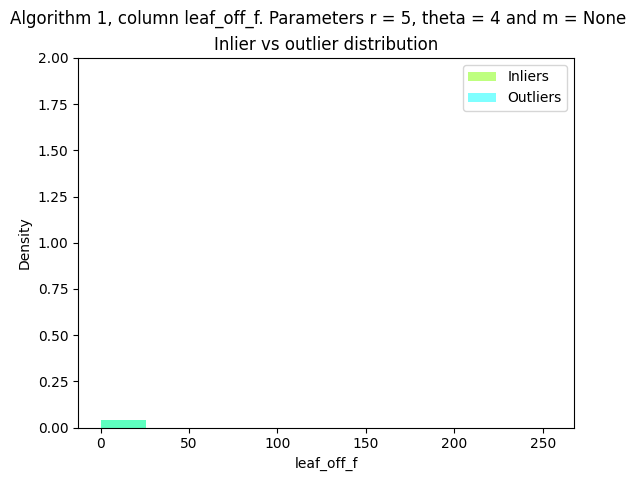

In [358]:
plot_categorical_dist(df_ghana_subsample, outlier_dict, 'leaf_off_f', r=5, theta=4, alg_no=1)

We iterate through all the `cat_cols` and save plots

In [332]:
def save_cat_plots(gdf: gpd.GeoDataFrame, outlier_dict: dict, cat_cols: list, r_vals: list, theta_vals: list, m_vals: list):
    """
    Iterate through parameter combinations and save all categorical plots.

    INPUTS:
    gdf: df in which outliers have been detected (gpd.GeoDataFrame)
    outlier_dict: mapping of parameter values to outliers detected therewith (dict) 
    cat_cols: name of categorical columns to plot (str)
    r_vals: values of r to plot (list)
    theta_vals: values of theta to plot (list)
    m_vals: values of m to plot (list)
    """
    os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis\Algorithm Sensitivity Plots\Categorical columns")

    for col in cat_cols:

        # algorithms 1 & 2
        for r in r_vals:

            for theta in theta_vals:

                plot_categorical_dist(gdf, outlier_dict, col=col, r=r, theta=theta, alg_no=1)
                plot_categorical_dist(gdf, outlier_dict, col=col, r=r, theta=theta, alg_no=2)

        # algorithm 3

        for r in r_vals:

            for m in m_vals:
                
                plot_categorical_dist(gdf, outlier_dict, col=col, r=r, m=m, alg_no=3)


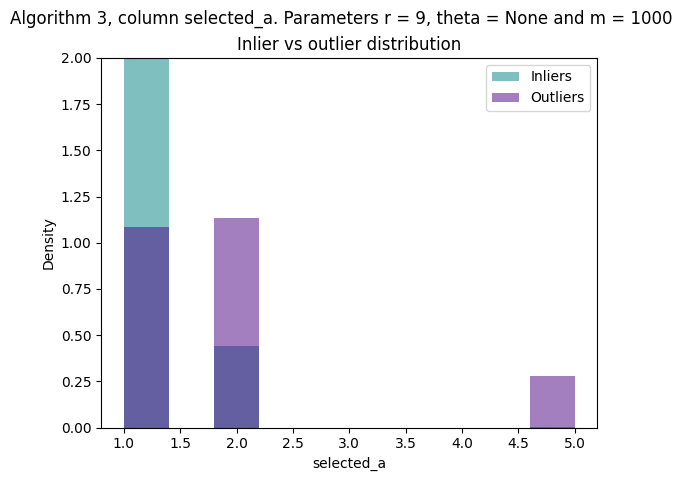

In [361]:
cat_cols_cool = ['pft_class', 'leaf_off_f', 'beam', 'selected_a']
r_vals = np.arange(1,10,2)
theta_vals = np.arange(2,10,2)
m_vals = np.arange(250,1250, 250)

save_cat_plots(gdf=df_ghana_subsample, outlier_dict=outlier_dict, cat_cols=cat_cols_cool, r_vals=r_vals, theta_vals=theta_vals, m_vals=m_vals)

We iterate through all the `num_cols` and save plots.

In [133]:
def save_all_plots(gdf: gpd.GeoDataFrame, outlier_dict: dict, num_cols: list):
    """
    Save plots showing the progression of every parameter at all fixed values of the other parameters.

    INPUTS:
    gdf: df in which outliers have been detected (gpd.GeoDataFrame)
    outlier_dict: dictionary with parameter combinations as keys (tuple), outliers as values (np.ndarray)
    num_cols: names of numeric columns in gdf (list)
    """

    # infer unique parameter values
    unique_r = sorted(list(set(key[1] for key, _ in outlier_dict.items())))
    unique_theta = sorted(list(set(key[2] for key, _ in outlier_dict.items() if key[0] in [1,2])))
    unique_m = sorted(list(set(key[2] for key, _ in outlier_dict.items() if key[0] == 3)))

    # create list of tuples (theta, m)
    theta_m_list = list(zip(unique_theta, unique_m))

    for col in num_cols:
        
        # x value is r
        for theta, m in theta_m_list:
            plot_summary_stats(gdf, outlier_dict, param_to_vary='r', r=None, theta=theta, m=m, col=col)

        # x value is theta
        for r in unique_r:
            plot_summary_stats(gdf, outlier_dict, param_to_vary='theta', r=r, theta=None, m=None, col=col)

        # x value is m        
        for r in unique_r:
            plot_summary_stats(gdf, outlier_dict, param_to_vary='m', r=r, theta=None, m=None, col=col)

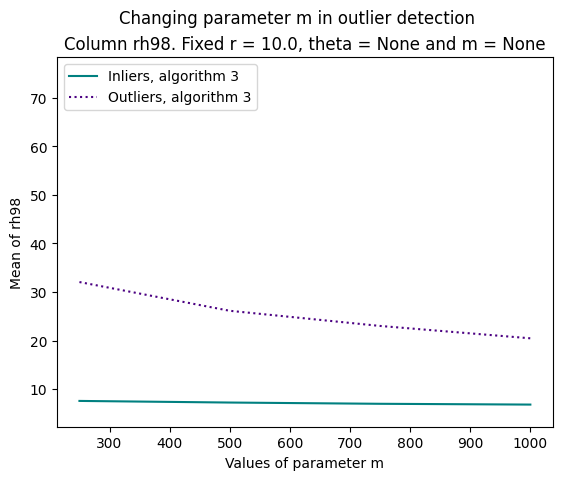

In [134]:
os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis\Algorithm Sensitivity Plots\Outlier_Dict123")
cols_of_interest = ['urban_prop', 'agbd', 'agbd_se', 'sensitivit', 'solar_elev', 'rh98']
save_all_plots(df_ghana_subsample, outlier_dict, cols_of_interest)

### Make a gif from plots

Let's make three gifs, corresponding to the three variables that we could have on our x axis: r, m and theta. I think that due to the .png naming convention, frames will automatically be ordered in ascending order of the values of the variable parameter...

In [151]:
# first, identify pictures for each parameter
filenames = [f for f in os.listdir() if f[-3:] == 'png'] # r'Algorithm Sensitivity Plots\Outlier_Dict123'
filenames_r = [f for f in filenames if 'Variable r' in f]
filenames_theta = [f for f in filenames if 'Variable theta' in f and 'r = 10.0' not in f]
filenames_m = [f for f in filenames if 'Variable m' in f and 'r = 10.0' not in f]

# for simplicity, we drop r = 10.0

# change directory
os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis\Algorithm Sensitivity Plots\Outlier_Dict123")

# gif names
path_to_gif_r = "variable_parameter_r.gif"
path_to_gif_theta = "variable_parameter_theta.gif"
path_to_gif_m = "variable_parameter_m.gif"

# variable r
with imageio.get_writer(path_to_gif_r, mode='I', fps=0.5) as writer:
    for f in filenames_r:
        image = imageio.imread(f)
        writer.append_data(image)

# variable theta
with imageio.get_writer(path_to_gif_theta, mode='I', fps=1) as writer:
    for f in filenames_theta:
        image = imageio.imread(f)
        writer.append_data(image)

# variable m
with imageio.get_writer(path_to_gif_m, mode='I', fps=1) as writer:
    for f in filenames_m:
        image = imageio.imread(f)
        writer.append_data(image)

C:\Users\nial\AppData\Local\Temp\ipykernel_35048\941715536.py:20: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f)
C:\Users\nial\AppData\Local\Temp\ipykernel_35048\941715536.py:26: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f)
C:\Users\nial\AppData\Local\Temp\ipykernel_35048\941715536.py:32: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.

We also want to make gifs for the distributions of categorical columns.

In [363]:
def categorical_gif(alg_no: int, col:str, param_to_vary: str, r: float=None, theta: float=None, m: int=None, fps: float=0.5):
    """
    Create a gif of how the distribution of a categorical predictor changes with a parameter.
    Must manually ensure that parameter combinations and algorithm number are compatible.

    INPUTS:
    alg_no: 1, 2 or 3 (int)
    col: column to plot (str)
    param_to_vary: name of parameter to vary between frames (str)
    r: fixed level (float)
    theta: fixed level (float)
    m: fixed level (int)
    """
    # get all possible frames
    os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis\Algorithm Sensitivity Plots\Categorical columns")
    filenames = [f for f in os.listdir() if f[-3:] == 'png' and 'm = 1000' not in f]

    # filter to the frames for this gif
    if param_to_vary == 'r': str_contents = [f'Algorithm {alg_no}', f'column {col}', f'theta = {theta}', f'm = {m}']
    elif param_to_vary == 'theta': str_contents = [f'Algorithm {alg_no}', f'column {col}', f'r = {r}', f'm = {m}']
    elif param_to_vary == 'm': str_contents = [f'Algorithm {alg_no}', f'column {col}', f'r = {r}', f'theta = {theta}']

    frames = [f for f in filenames if all(substring in f for substring in str_contents)]

    # write gif
    path_to_gif = f'Column {col}. Variable {param_to_vary}. Fixed r = {r}, theta = {theta} and m = {m}.gif'
    
    with imageio.get_writer(path_to_gif, mode='I', fps=fps) as writer:
        for frame in frames:
            image = imageio.imread(frame)
            writer.append_data(image)

In [367]:
categorical_gif(alg_no=2, col='pft_class', param_to_vary='r', theta=4)

C:\Users\nial\AppData\Local\Temp\ipykernel_35048\3415754978.py:30: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame)


After evaluating the means of predictors in the outlier population, we want to evaluate the geographic distribution of outliers.

In [191]:
def plot_outliers_ghana(gdf: gpd.GeoDataFrame, outliers: np.ndarray, title: str=None):
    """
    Plot a map with the outliers detected by algorithm_grid_search().

    INPUTS:
    gdf: df in which outliers have been detected (gpd.GeoDataFrame)
    outliers: array of 1s for outliers and 0s for inliers (np.ndarray)
    title: map title to display (str)
    """
    gdf['outlier'] = outliers
    index = [0,1]
    colour_list = ['green', 'red']
    colour_dict = {index:colour for index, colour in zip(index, colour_list)}

    # Ghana tile
    ghana_map = folium.Map(location=[7.9465, -1.0232], zoom_start=7)

    # plot rows
    for _, row in gdf.iterrows():

        geom = row['geometry']
        colour_index = row['outlier']

        if colour_index == 0: continue # only plot outliers

        folium.CircleMarker(    
          location=[geom.y, geom.x]
        , radius=2 if colour_index == 1 else 3
        , fill=True
        , color=colour_dict[colour_index]
        ).add_to(ghana_map)

    legend_html = '''
        <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 130px; height: 180px; 
                 border:2px solid grey; z-index:9999; font-size:14px;
                 background-color: white;
                 ">&nbsp; Legend <br>
                 &nbsp; Not anomaly &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:green"></i><br>
                 &nbsp; Anomaly &nbsp; <i class="fa fa-circle 
                                  fa-1x" style="color:red"></i><br>
        </div>
        '''
    
    title_html = f'''
    <div style="position: fixed; 
                top: 10px; left: 0; width: 100%; 
                z-index:9999; font-size:24px; text-align: center;
                background-color: white; padding: 10px;">
        <h3 style="margin: 0;">{title}</h3>
    </div>
    '''

    ghana_map.get_root().html.add_child(folium.Element(legend_html))
    ghana_map.get_root().html.add_child(folium.Element(title_html))

    # return the map
    return ghana_map

In [209]:
def plot_outliers_dict(gdf: gpd.GeoDataFrame, outlier_dict: dict):
    """
    Save folium outlier plot for every parameter combination in outlier_dict.

    INPUTS:
    gdf: df in which outliers have been detected (gpd.GeoDataFrame)
    outlier_dict: output from algorithm_grid_search()
    """
    # change directory
    os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis\Algorithm Sensitivity Plots\Outlier Maps")

    for key, value in outlier_dict.items():

        # define title
        param_2 = "m" if key[0] == 3 else "theta"
        title = f"Outlier map. Alg no = {key[0]}, r = {key[1]}, {param_2} = {key[2]}"

        # get map
        ghana_map = plot_outliers_ghana(gdf, value, title)
        
        # save map
        ghana_map.save(title + ".html")

        # save screenshot as png
        # hti = Html2Image(custom_flags=['--virtual-time-budget=10000', '--hide-scrollbars'])
        hti.screenshot(html_file= title + ".html", save_as= title + ".png")

In [210]:
plot_outliers_dict(df_ghana_subsample, outlier_dict)

We now have plots for every combination of parameters. There are different ways to combine them into gifs: by varying r and keeping theta / m fixed, or the other way around. Let's make a function that can handle any desired combination of the images.

In [241]:
def gif_outlier_maps(alg_no: int=1, param_to_vary: str = 'r', r: float=None, theta: float=None, m: int=None, fps: float=0.5):
    """
    Create a gif from images with specified algorithm number, varying only the specified parameter.

    INPUTS:
    alg_no: results from algorithm 1, 2 or 3 (int)
    param_to_vary: name of param to vary between frames (str)
    r: fixed level of r; ignored if param_to_vary == 'r' (float)
    theta: fixed level of theta; ignored if param_to_vary == 'theta' (float)
    m: fixed level of m; ignored if param_to_vary == 'm' (float)
    fps: fps of gif (float)
    """
    # change directory
    os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Master Thesis\Algorithm Sensitivity Plots\Outlier Maps")

    filenames = [f for f in os.listdir() if f[-3:] == 'png']

    # check parameter spec
    if sum(((r == None), (theta == None), (m == None))) != 2:
        raise(Exception("One and only one of r, theta or m should be specified."))
    
    # define frames
    fixed_param_name = 'r' if r else ('theta' if theta else 'm')
    fixed_param = r if r else (theta if theta else m)
    frames = [fname for fname in filenames if (f"{fixed_param_name} = {fixed_param}" in fname) and (f"Alg no = {alg_no}" in fname) and ("r = 10.0" not in fname)] 

    # make and save gif
    gif_name = f"Alg no = {alg_no}, variable parameter {param_to_vary}, fixed param {fixed_param_name} = {fixed_param}.gif"

    with imageio.get_writer(gif_name, mode='I', fps=fps) as writer:
        for frame in frames:
            image = imageio.imread(frame)
            writer.append_data(image)

Now, let's make a gif for each parameter x alg_no combination

In [243]:
gif_outlier_maps(alg_no=1, param_to_vary= 'r', theta=4, fps=1)
gif_outlier_maps(alg_no=1, param_to_vary= 'theta', r=5.0, fps=0.5)
gif_outlier_maps(alg_no=2, param_to_vary= 'r', theta=4, fps=1)
gif_outlier_maps(alg_no=2, param_to_vary= 'theta', r=5.0, fps=0.5)
gif_outlier_maps(alg_no=3, param_to_vary= 'r', m=500, fps=1)
gif_outlier_maps(alg_no=3, param_to_vary= 'm', r=5, fps=0.5)

C:\Users\nial\AppData\Local\Temp\ipykernel_35048\3125986961.py:32: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame)


The outlier plots reveal different geographic patterns in outlier identification. Algorithm 1 predominantly identifies outliers in the North East of Ghana, whereas algorithms 2 & 3 predominantly identify outliers in the South West. We will now visualize the distribution of `agbd` values throughout Ghana to see if there is any association between `agbd` and outlier status.

In [277]:
def visualize_agbd(gdf: gpd.GeoDataFrame):
    """
    Plot points with a colour determined by their agbd value.

    INPUTS:
    gdf: df including column `agbd`
    """
    # Ghana tile
    ghana_map = folium.Map(location=[7.9465, -1.0232], zoom_start=7)

    # colour map
    vmin, vmax = round(gdf['agbd'].min(),2), round(gdf['agbd'].max(),2)
    cmap = cm.LinearColormap(['white', 'blue'], vmin=vmin, vmax=vmax)

    # plot rows
    for _, row in gdf.iterrows():

        geom = row['geometry']

        folium.CircleMarker(    
          location=[geom.y, geom.x]
        , radius=2
        , fill=True
        , color=cmap(row['agbd'])
        ).add_to(ghana_map)

    # legend
    colorbar_html = cmap._repr_html_()
    legend_html = f'''
    <div style="position: fixed; 
             bottom: 50px; left: 50px; width: 130px; height: 280px; 
             z-index:9999; font-size:14px;">
             <div style="transform: rotate(270deg);">{colorbar_html}</div>
    </div>
    '''
    
    title = f"{len(gdf)} points from Ghana data coloured by agbd values"

    title_html = f'''
    <div style="position: fixed; 
                top: 10px; left: 0; width: 100%; 
                z-index:9999; font-size:24px; text-align: center;
                background-color: white; padding: 10px;">
        <h3 style="margin: 0;">{title}</h3>
    </div>
    '''

    ghana_map.get_root().html.add_child(folium.Element(legend_html))
    ghana_map.get_root().html.add_child(folium.Element(title_html))

    # return the map
    return ghana_map

In [278]:
ghana_map = visualize_agbd(df_ghana_subsample)
ghana_map